In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.interpolate import griddata
import time
from itertools import product, combinations
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from plotting import newfig, savefig
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from matplotlib import rc

np.random.seed(1234)
# tf.set_random_seed(1234)

print(tf.__version__)

1.15.0


/home/quantumiracle/anaconda3/envs/x/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.
  self[key] = other[key]


In [2]:
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x, y, t, u, v, layers):
        
        X = np.concatenate([x, y, t], 1)
        
        self.lb = X.min(0)
        self.ub = X.max(0)
                
        self.X = X
        
        self.x = X[:,0:1]
        self.y = X[:,1:2]
        self.t = X[:,2:3]
        
        self.u = u
        self.v = v
        
        self.layers = layers
        
        # Initialize NN
        self.weights, self.biases = self.initialize_NN(layers)        
        
        # Initialize parameters
        self.lambda_1 = tf.Variable([0.0], dtype=tf.float32)
        self.lambda_2 = tf.Variable([0.0], dtype=tf.float32)
        
        # tf placeholders and graph
        self.sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True,
                                                     log_device_placement=True))
        
        self.x_tf = tf.placeholder(tf.float32, shape=[None, self.x.shape[1]])
        self.y_tf = tf.placeholder(tf.float32, shape=[None, self.y.shape[1]])
        self.t_tf = tf.placeholder(tf.float32, shape=[None, self.t.shape[1]])
        
        self.u_tf = tf.placeholder(tf.float32, shape=[None, self.u.shape[1]])
        self.v_tf = tf.placeholder(tf.float32, shape=[None, self.v.shape[1]])
        
        self.u_pred, self.v_pred, self.p_pred, self.f_u_pred, self.f_v_pred = self.net_NS(self.x_tf, self.y_tf, self.t_tf)
        
        self.loss = tf.reduce_sum(tf.square(self.u_tf - self.u_pred)) + \
                    tf.reduce_sum(tf.square(self.v_tf - self.v_pred)) + \
                    tf.reduce_sum(tf.square(self.f_u_pred)) + \
                    tf.reduce_sum(tf.square(self.f_v_pred))
                    
        self.optimizer = tf.contrib.opt.ScipyOptimizerInterface(self.loss, 
                                                                method = 'L-BFGS-B', 
                                                                options = {'maxiter': 30,  # original maxiter is 50000
                                                                           'maxfun': 50000,
                                                                           'maxcor': 50,
                                                                           'maxls': 50,
                                                                           'ftol' : 1.0 * np.finfo(float).eps})        
        
        self.optimizer_Adam = tf.train.AdamOptimizer()
        self.train_op_Adam = self.optimizer_Adam.minimize(self.loss)                    
        
        init = tf.global_variables_initializer()
        self.sess.run(init)

    def initialize_NN(self, layers):        
        weights = []
        biases = []
        num_layers = len(layers) 
        for l in range(0,num_layers-1):
            W = self.xavier_init(size=[layers[l], layers[l+1]])
            b = tf.Variable(tf.zeros([1,layers[l+1]], dtype=tf.float32), dtype=tf.float32)
            weights.append(W)
            biases.append(b)        
        return weights, biases
        
    def xavier_init(self, size):
        in_dim = size[0]
        out_dim = size[1]        
        xavier_stddev = np.sqrt(2/(in_dim + out_dim))
        return tf.Variable(tf.truncated_normal([in_dim, out_dim], stddev=xavier_stddev), dtype=tf.float32)
    
    def neural_net(self, X, weights, biases):
        num_layers = len(weights) + 1
        
        H = 2.0*(X - self.lb)/(self.ub - self.lb) - 1.0
        for l in range(0,num_layers-2):
            W = weights[l]
            b = biases[l]
            H = tf.tanh(tf.add(tf.matmul(H, W), b))
        W = weights[-1]
        b = biases[-1]
        Y = tf.add(tf.matmul(H, W), b)
        return Y
        
    def net_NS(self, x, y, t):
        lambda_1 = self.lambda_1
        lambda_2 = self.lambda_2
        
        psi_and_p = self.neural_net(tf.concat([x,y,t], 1), self.weights, self.biases)
        psi = psi_and_p[:,0:1]
        p = psi_and_p[:,1:2]
        
        u = tf.gradients(psi, y)[0]
        v = -tf.gradients(psi, x)[0]  
        
        u_t = tf.gradients(u, t)[0]
        u_x = tf.gradients(u, x)[0]
        u_y = tf.gradients(u, y)[0]
        u_xx = tf.gradients(u_x, x)[0]
        u_yy = tf.gradients(u_y, y)[0]
        
        v_t = tf.gradients(v, t)[0]
        v_x = tf.gradients(v, x)[0]
        v_y = tf.gradients(v, y)[0]
        v_xx = tf.gradients(v_x, x)[0]
        v_yy = tf.gradients(v_y, y)[0]
        
        p_x = tf.gradients(p, x)[0]
        p_y = tf.gradients(p, y)[0]

        f_u = u_t + lambda_1*(u*u_x + v*u_y) + p_x - lambda_2*(u_xx + u_yy) 
        f_v = v_t + lambda_1*(u*v_x + v*v_y) + p_y - lambda_2*(v_xx + v_yy)
        
        return u, v, p, f_u, f_v
    
    def callback(self, loss, lambda_1, lambda_2):
        print('Loss: %.3e, l1: %.3f, l2: %.5f' % (loss, lambda_1, lambda_2))
      
    def train(self, nIter): 

        tf_dict = {self.x_tf: self.x, self.y_tf: self.y, self.t_tf: self.t,
                   self.u_tf: self.u, self.v_tf: self.v}
        
        start_time = time.time()
        for it in range(nIter):
            self.sess.run(self.train_op_Adam, tf_dict)
            
            # Print
            if it % 10 == 0:
                elapsed = time.time() - start_time
                loss_value = self.sess.run(self.loss, tf_dict)
                lambda_1_value = self.sess.run(self.lambda_1)
                lambda_2_value = self.sess.run(self.lambda_2)
#                 print('It: %d, Loss: %.3e, l1: %.3f, l2: %.5f, Time: %.2f' % 
#                       (it, loss_value, lambda_1_value, lambda_2_value, elapsed))
                start_time = time.time()
            
        self.optimizer.minimize(self.sess,
                                feed_dict = tf_dict,
                                fetches = [self.loss, self.lambda_1, self.lambda_2],
                                loss_callback = self.callback)
            
    
    def predict(self, x_star, y_star, t_star):
        
        tf_dict = {self.x_tf: x_star, self.y_tf: y_star, self.t_tf: t_star}
        
        u_star = self.sess.run(self.u_pred, tf_dict)
        v_star = self.sess.run(self.v_pred, tf_dict)
        p_star = self.sess.run(self.p_pred, tf_dict)
        
        return u_star, v_star, p_star

def plot_solution(X_star, u_star, index):
    
    lb = X_star.min(0)
    ub = X_star.max(0)
    nn = 200
    x = np.linspace(lb[0], ub[0], nn)
    y = np.linspace(lb[1], ub[1], nn)
    X, Y = np.meshgrid(x,y)
    
    U_star = griddata(X_star, u_star.flatten(), (X, Y), method='cubic')
    
    plt.figure(index)
    plt.pcolor(X,Y,U_star, cmap = 'jet')
    plt.colorbar()
    
    
def axisEqual3D(ax):
    extents = np.array([getattr(ax, 'get_{}lim'.format(dim))() for dim in 'xyz'])
    sz = extents[:,1] - extents[:,0]
    centers = np.mean(extents, axis=1)
    maxsize = max(abs(sz))
    r = maxsize/4
    for ctr, dim in zip(centers, 'xyz'):
        getattr(ax, 'set_{}lim'.format(dim))(ctr - r, ctr + r)

In [3]:
if __name__ == "__main__": 
      
    N_train = 5000
    
    layers = [3, 20, 20, 20, 20, 20, 20, 20, 20, 2]
    
    # Load Data
    data = scipy.io.loadmat('../Data/cylinder_nektar_wake.mat')
           
    U_star = data['U_star'] # N x 2 x T; full data of (u, v) at all x, y, t
    P_star = data['p_star'] # N x T; full data of p at all x, y, t
    t_star = data['t'] # T x 1; t corrdinates of the full data
    X_star = data['X_star'] # N x 2; (x,y) coordinates of the full data
    
    N = X_star.shape[0] # N=5000; size of the full data at a fixed t
    T = t_star.shape[0] # T=200; size of the full data at a fixed x,y
    
    # Rearrange Data 
    XX = np.tile(X_star[:,0:1], (1,T)) # N x T
    YY = np.tile(X_star[:,1:2], (1,T)) # N x T
    TT = np.tile(t_star, (1,N)).T # N x T
    
    UU = U_star[:,0,:] # N x T
    VV = U_star[:,1,:] # N x T
    PP = P_star # N x T
    
    x = XX.flatten()[:,None] # NT x 1
    y = YY.flatten()[:,None] # NT x 1
    t = TT.flatten()[:,None] # NT x 1
    
    u = UU.flatten()[:,None] # NT x 1
    v = VV.flatten()[:,None] # NT x 1
    p = PP.flatten()[:,None] # NT x 1
    
    ######################################################################
    ######################## Noiseles Data ###############################
    ######################################################################
    # Training Data    
    idx = np.random.choice(N*T, N_train, replace=False) # Generate a random sample from np.arange(N*T) of size N_train without replacement
    x_train = x[idx,:]
    y_train = y[idx,:]
    t_train = t[idx,:]
    u_train = u[idx,:]
    v_train = v[idx,:]

    # Training
    model = PhysicsInformedNN(x_train, y_train, t_train, u_train, v_train, layers)
    model.train(10000)  # original niter is 200000
    
    # Test Data
    snap = np.array([100])
    x_star = X_star[:,0:1]
    y_star = X_star[:,1:2]
    t_star = TT[:,snap]
    
    u_star = U_star[:,0,snap]
    v_star = U_star[:,1,snap]
    p_star = P_star[:,snap]
    
    # Prediction
    u_pred, v_pred, p_pred = model.predict(x_star, y_star, t_star)
    lambda_1_value = model.sess.run(model.lambda_1)
    lambda_2_value = model.sess.run(model.lambda_2)
    
    # Error
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
    error_v = np.linalg.norm(v_star-v_pred,2)/np.linalg.norm(v_star,2)
    error_p = np.linalg.norm(p_star-p_pred,2)/np.linalg.norm(p_star,2)

    error_lambda_1 = np.abs(lambda_1_value - 1.0)*100
    error_lambda_2 = np.abs(lambda_2_value - 0.01)/0.01 * 100
    
    print('Error u: %e' % (error_u))    
    print('Error v: %e' % (error_v))    
    print('Error p: %e' % (error_p))    
    print('Error l1: %.5f%%' % (error_lambda_1))                             
    print('Error l2: %.5f%%' % (error_lambda_2))                  
    
    # Plot Results
#    plot_solution(X_star, u_pred, 1)
#    plot_solution(X_star, v_pred, 2)
#    plot_solution(X_star, p_pred, 3)    
#    plot_solution(X_star, p_star, 4)
#    plot_solution(X_star, p_star - p_pred, 5)
    
    # Predict for plotting
    lb = X_star.min(0)  # lb = [1, -2]; smallest value of (x,y) of the fulll data
    ub = X_star.max(0)  # ub = [8, 2];  largest value of (x,y) of the full data
    nn = 200
    x = np.linspace(lb[0], ub[0], nn)
    y = np.linspace(lb[1], ub[1], nn)
    X, Y = np.meshgrid(x,y)
    
    UU_star = griddata(X_star, u_pred.flatten(), (X, Y), method='cubic')
    VV_star = griddata(X_star, v_pred.flatten(), (X, Y), method='cubic')
    PP_star = griddata(X_star, p_pred.flatten(), (X, Y), method='cubic')
    P_exact = griddata(X_star, p_star.flatten(), (X, Y), method='cubic')
    
    
    ######################################################################
    ########################### Noisy Data ###############################
    ######################################################################
    noise = 0.01        
    u_train = u_train + noise*np.std(u_train)*np.random.randn(u_train.shape[0], u_train.shape[1])
    v_train = v_train + noise*np.std(v_train)*np.random.randn(v_train.shape[0], v_train.shape[1])    

    # Training
    model = PhysicsInformedNN(x_train, y_train, t_train, u_train, v_train, layers)
    model.train(30)  # original niter is 200000
        
    lambda_1_value_noisy = model.sess.run(model.lambda_1)
    lambda_2_value_noisy = model.sess.run(model.lambda_2)
      
    error_lambda_1_noisy = np.abs(lambda_1_value_noisy - 1.0)*100
    error_lambda_2_noisy = np.abs(lambda_2_value_noisy - 0.01)/0.01 * 100
        
    print('Error l1: %.5f%%' % (error_lambda_1_noisy))                             
    print('Error l2: %.5f%%' % (error_lambda_2_noisy))     




Device mapping:
/job:localhost/replica:0/task:0/device:XLA_CPU:0 -> device: XLA_CPU device
/job:localhost/replica:0/task:0/device:XLA_GPU:0 -> device: XLA_GPU device

Device mapping:
/job:localhost/replica:0/task:0/device:XLA_CPU:0 -> device: XLA_CPU device
/job:localhost/replica:0/task:0/device:XLA_GPU:0 -> device: XLA_GPU device



2022-04-19 16:35:34.164030: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2022-04-19 16:35:34.194616: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2496000000 Hz
2022-04-19 16:35:34.195882: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x5612fa7902f0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-04-19 16:35:34.195911: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-04-19 16:35:34.199160: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2022-04-19 16:35:34.301517: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-19 16:35:34.

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



truncated_normal/TruncatedNormal: (TruncatedNormal): /job:localhost/replica:0/task:0/device:CPU:0
truncated_normal/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
truncated_normal: (Add): /job:localhost/replica:0/task:0/device:CPU:0
Variable: (VariableV2): /job:localhost/replica:0/task:0/device:CPU:0
Variable/Assign: (Assign): /job:localhost/replica:0/task:0/device:CPU:0
Variable/read: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Variable_1: (VariableV2): /job:localhost/replica:0/task:0/device:CPU:0
Variable_1/Assign: (Assign): /job:localhost/replica:0/task:0/device:CPU:0
Variable_1/read: (Identity): /job:

2022-04-19 16:35:49.404427: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal/TruncatedNormal: (TruncatedNormal): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404450: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404456: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal: (Add): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404461: I tensorflow/core/common_runtime/placer.cc:54] Variable: (VariableV2): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404466: I tensorflow/core/common_runtime/placer.cc:54] Variable/Assign: (Assign): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404471: I tensorflow/core/common_runtime/placer.cc:54] Variable/read: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.404475: I tensorflow/core/common_runtime/placer.cc:54] Variable_1: (Variabl

gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/MatMul_4_grad/MatMul_grad/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/MatMul_4_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_6/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_1_grad/Shape: (Shape): /job:localhost/replica:

:0/device:CPU:0
2022-04-19 16:35:49.569383: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Tanh_2_grad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.570686: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Add_2_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.570693: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Add_2_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.570698: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Add_2_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.570702: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Add_2_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.570707: I tensorflow/core/common_runtime/placer.cc:54] gradients_5/Add_2_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/de

gradients_9/Add_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_1_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_1_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/MatMul_1_grad/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/MatMul_1_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/AddN_6: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Tanh_grad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_9/Add_grad/Reshape: (Reshape):

sorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/add: (AddV2): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.976103: I tensorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/mod: (FloorMod): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.976109: I tensorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.976113: I tensorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.976118: I tensorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:49.976131: I tensorflow/core/common_runtime/placer.cc:54] gradients_11/gradients_9/Add_6_grad/Sum_grad/DynamicSt

gradients_11/gradients_1/Add_6_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Add_6_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Add_6_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Add_6_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Add_6_grad/Sum_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Add_6_grad/Sum_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Tanh_6_grad/TanhGrad_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Tanh_6_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_11/gradients_1/Tanh_6_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_

orflow/core/common_runtime/placer.cc:54] gradients_14/gradients_6/truediv_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.176006: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_6/truediv_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.176010: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_6/truediv_grad/Sum_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.176016: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_6/truediv_grad/Sum_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.178686: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_7/truediv_grad/RealDiv_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.178698: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_7/tru

gradients_14/gradients_9/truediv_grad/RealDiv_grad/Neg: (Neg): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_9/truediv_grad/RealDiv_grad/RealDiv_1: (RealDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_9/truediv_grad/RealDiv_grad/RealDiv_2: (RealDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_9/truediv_grad/RealDiv_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_9/truediv_grad/RealDiv_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_9/truediv_grad/RealDiv_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_13/Add_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_13/Add_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/MatMul_grad/MatMul_grad/MatMul: (MatMul): /job:localhost/replica:0/task:

replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.387954: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Add_2_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.387960: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Add_2_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.387966: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Add_2_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.387980: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Add_2_grad/Sum_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.387998: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Add_2_grad/Sum_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.388007: I tensorf

gradients_14/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul_2_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul_2_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul_2_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul_2_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients/Tanh_2_grad/TanhGrad_grad/mul_2_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients/Tanh_2_grad/TanhGrad_grad/mul_2_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients/Tanh_2_grad/TanhGrad_grad/mul_2_grad/BroadcastGradientA

ost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.592265: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.592268: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.592273: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.592277: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:

gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_10/gradients_1/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradi

_6_grad/TanhGrad_grad/mul_2_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.792153: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_11/MatMul_7_grad/MatMul_grad/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.792160: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_11/MatMul_7_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.792167: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_2/gradients/Tanh_6_grad/TanhGrad_grad/mul_2_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.792174: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_2/gradients/Tanh_6_grad/TanhGrad_grad/mul_2_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.792181: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_2/

gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_grad/Sum_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/T

e/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_1/Add_6_grad/Sum_grad/Tile_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.997654: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_1/Add_6_grad/Sum_grad/Tile_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.997663: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_1/Add_6_grad/Sum_grad/Tile_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.997671: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_1/Add_6_grad/Sum_grad/Tile_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:50.997680: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_11/gradients_9/gradients_1/Tanh_6_grad/TanhGrad_grad/mul_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/d

gradients_14/gradients_11/gradients_1/MatMul_6_grad/MatMul_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/AddN_35: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/stack: (Pack): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/transpose: (Transpose): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_5_grad/Sum_grad/Tile_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_1

 gradients_14/AddN_79: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.203162: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/gradients_3/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.203167: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/gradients_3/gradients/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.203171: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/gradients/Add_3_grad/Reshape_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.203175: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/gradients/Add_3_grad/Reshape_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.203180: I tens

gradients_14/gradients_11/gradients_1/Add_2_grad/Sum_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_1_grad/Reshape_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_2/gradients/Add_1_grad/Reshape_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/AddN_94: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/Tanh_5_grad/TanhGrad_grad/TanhGrad_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/Tanh_5_grad/TanhGrad_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/Tanh_5_grad/TanhGrad_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_5/gradients_3/Tanh_5_grad/TanhGrad_grad/TanhGrad_grad/TanhGrad: (TanhGrad): /job:localhost

9 16:35:51.405686: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/Add_2_grad/Sum_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.405689: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/Add_2_grad/Sum_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.405693: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/Add_2_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.405696: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/Add_2_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.405699: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/Add_2_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.405702: I tensorflow/core/common_runtime/placer.cc:54] gradients

gradients_14/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_1_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_1_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_4/gradients/Tanh_3_grad/TanhGrad_grad/mul_1_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_4/Add_4_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_4/Add_4_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/AddN_198: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_8/gradie

/common_runtime/placer.cc:54] gradients_14/gradients_9/gradients_1/Add_grad/Sum_grad/Tile_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.597594: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/AddN_272: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.597601: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/gradients/Add_grad/Sum_grad/Tile_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.597608: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/gradients/Add_grad/Sum_grad/Tile_grad/stack: (Pack): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.597616: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/gradients/Add_grad/Sum_grad/Tile_grad/transpose: (Transpose): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.597623: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradi

gradients_14/gradients/MatMul_8_grad/MatMul_grad/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients/MatMul_8_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/Add_7_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/AddN_291: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/MatMul_7_grad/MatMul: (MatMul): /job:localhost/repli

(FloorMod): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.811029: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients/truediv_grad/Sum_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.811034: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients/truediv_grad/Sum_grad/range: (Range): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.811040: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients/truediv_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.811045: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients/truediv_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:51.811051: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients/truediv_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:5

gradients_15/gradients_4/sub_1_grad/Sum_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_4/sub_1_grad/Sum_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_4/sub_1_grad/Sum_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_4/sub_1_grad/Sum_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_4/sub_1_grad/Sum_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_4/sub_1_grad/Sum_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_12/Tanh_grad/TanhGrad_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_12/Tanh_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_12/Tanh_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/

rflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.014193: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.014200: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.014207: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.014215: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/d

gradients_15/gradients_5/Tanh_2_grad/TanhGrad_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/AddN_5_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/AddN_5_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/AddN_5_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/Tanh_2_grad/TanhGrad_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/Tanh_2_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/Tanh_2_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/Tanh_2_grad/TanhGrad_grad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/Tanh_2_grad/TanhGrad_grad/tuple/group_deps:

rad_grad/TanhGrad_grad/mul_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.212873: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/TanhGrad_grad/mul_1_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.212877: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/TanhGrad_grad/mul_1_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.212881: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/TanhGrad_grad/mul_1_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.212885: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/TanhGrad_grad/mul_1_grad/tuple/group_

gradients_15/gradients_10/gradients_8/Tanh_3_grad/TanhGrad_grad/mul_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_3_grad/TanhGrad_grad/mul_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Mul_1_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Mul_1_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Mul_1_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_3_grad/TanhGrad_grad/mul_2_grad/Mul_1_grad/Mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradien

sorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_7/gradients_1/Tanh_5_grad/TanhGrad_grad/mul_2_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.425353: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_7/gradients_1/Tanh_5_grad/TanhGrad_grad/mul_2_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.425361: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_7/gradients_1/Tanh_5_grad/TanhGrad_grad/mul_2_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.425370: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_7/gradients_1/Tanh_5_grad/TanhGrad_grad/mul_2_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.425377: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_7/gradients_1/Tanh_5_grad/TanhGrad_grad/mul_2_grad/tuple/co

gradients_15/gradients_10/gradients_8/gradients_1/Add_4_grad/Sum_grad/Reshape_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device

t/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.615473: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_grad/Shape_1: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.617044: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_grad/BroadcastGradientArgs: (BroadcastGradientArgs): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.617062: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_grad/Mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.617068: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_10/gradients_8/gradients_1/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_grad/Sum: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
20

rad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_2/Tanh_7_grad/TanhGrad_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_2/Tanh_7_grad/TanhGrad_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_2/Tanh_7_grad/TanhGrad_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_4_grad/TanhGrad_grad/mul_1_grad/Reshape_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Add_5_grad/Sum_grad/Reshape_grad/Reshape_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Add_5_grad/Sum_g

2022-04-19 16:35:52.823783: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.823787: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.823790: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.825597: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:52.825605: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_6/grad

gradients_15/gradients_6/gradients_4/gradients/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients_4/gradients/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients_4/gradients/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients_4/gradients/Tanh_5_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/AddN_43: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients/Add_5_grad/Sum_grad/Tile_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients/Add_5_grad/Sum_grad/Tile_grad/stack: (Pack): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients/Add

acer.cc:54] gradients_15/AddN_78: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.031268: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.032654: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.032667: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.032672: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/Tanh_6_grad/TanhGrad_grad/TanhGrad_grad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.032677: I tensorflow/core/common_runtime/pl

TanhGrad_grad/mul_1_grad/Sum_1_grad/Fill: (Fill): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/DynamicStitch: (DynamicStitch): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Maximum: (Maximum): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/floordiv: (FloorDiv): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Reshape: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Tile: (Tile): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/AddN_90: (AddN): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients

9: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_9/gradients_1/Tanh_grad/TanhGrad_grad/mul_1_grad/Mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.230507: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_9/gradients_1/Tanh_grad/TanhGrad_grad/mul_1_grad/Sum_1: (Sum): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.230515: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_9/gradients_1/Tanh_grad/TanhGrad_grad/mul_1_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.230520: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_9/gradients_1/Tanh_grad/TanhGrad_grad/mul_1_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.230524: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_9/gradients_1/Tanh_grad/TanhGrad_grad/mul_1_grad/tuple/control_dependency: (Identit

gradients_15/gradients_9/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/Reshape_1: (Reshape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/Tanh_1_grad/TanhGrad_grad/mul_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/Add_2_grad/Sum_grad/Shape: (Shape): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/Add_2_grad/Sum_grad/add: (AddV2): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/Add_2_grad/Sum_grad/mod: (FloorMod): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/Add_2_grad/Sum_grad/Shape_1: (Shape): /job:localhost/replica:0/t

2-04-19 16:35:53.431306: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_4/Tanh_7_grad/TanhGrad_grad/mul_1: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.431311: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_4/Tanh_7_grad/TanhGrad_grad/mul_2: (Mul): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.431315: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_4/Tanh_7_grad/TanhGrad_grad/TanhGrad: (TanhGrad): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.431319: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_4/Tanh_7_grad/TanhGrad_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.431323: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_4/Tanh_7_grad/TanhGrad_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.431327: I tens

gradients_15/gradients_9/gradients_1/MatMul_6_grad/MatMul_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/group_deps: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/control_dependency: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_9/gradients_1/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/control_dependency_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_3/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/MatMul: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_3/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/MatMul_1: (MatMul): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_3/gradients/MatMul_6_grad/MatMul_grad/MatMul_grad/tuple/group_deps: (NoOp): /job:localhost/replica:

 16:35:53.632464: I tensorflow/core/common_runtime/placer.cc:54] zeros_3: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.632472: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal_4/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.632479: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal_4/mean: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.632487: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal_4/stddev: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.632495: I tensorflow/core/common_runtime/placer.cc:54] zeros_4: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.634043: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal_5/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.634059: I tensorflow/core/common_runtime/placer.cc:54] truncated_normal_5/mean: (Const): /job:

gradients_5/gradients_3/gradients/Add_3_grad/Sum_grad/Tile_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_3_grad/Sum_grad/Tile_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_3_grad/Sum_grad/Tile_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_2_grad/Sum_grad/Tile_grad/transpose/perm: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_2_grad/Sum_grad/Tile_grad/Reshape/shape: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_2_grad/Sum_grad/Tile_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_5/gradients_3/gradients/Add_2_grad/Sum_grad/Tile_grad/range/start: (Const): /j

s_12/Add_3_grad/Sum_grad/Maximum/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.835963: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_5/Tanh_2_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.835971: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_6/Tanh_2_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.835979: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_13/Tanh_3_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.835987: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_10/gradients_8/gradients_1/Tanh_1_grad/TanhGrad_grad/TanhGrad_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:53.835995: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_11/gradien

gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_2_grad/Sum_1_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_2_grad/Sum_1_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_6/gradients_4/gradients/Tanh_4_grad/TanhGrad_grad/mul_2_grad/Sum_1_grad/Maximum/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_7/Add_5_grad/Sum_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_7/Add_5_grad/Sum_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_7/Add_5_grad/Sum_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_7/Add_5_grad/Sum_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_14/gradients_7/Add_5_grad/Sum_grad/Maximum/y: (Const): /job:localho

1541: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_9/gradients_1/Add_4_grad/Sum_grad/Tile_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.031544: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_9/gradients_1/Add_4_grad/Sum_grad/Tile_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.031549: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_9/gradients_1/Add_4_grad/Sum_grad/Tile_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.031553: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/gradients/Add_4_grad/Sum_grad/Tile_grad/transpose/perm: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.031563: I tensorflow/core/common_runtime/placer.cc:54] gradients_14/gradients_3/gradients/Add_4_grad/Sum_grad/Tile_grad/Reshape/shape: (Const): /job:localhost/replica:0/tas

gradients_15/gradients_7/mul_grad/Sum_1_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_7/mul_grad/Sum_1_grad/Maximum/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/mul_grad/Sum_1_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/mul_grad/Sum_1_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/mul_grad/Sum_1_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/mul_grad/Sum_1_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/mul_grad/Sum_1_grad/Maximum/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_11/mul_grad/Sum_1_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_11/mul_grad/Sum_1_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradi

t): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.245107: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/gradients/Tanh_7_grad/TanhGrad_grad/mul_grad/Sum_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.245113: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/gradients/Tanh_7_grad/TanhGrad_grad/mul_grad/Sum_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.245118: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_5/gradients_3/gradients/Tanh_7_grad/TanhGrad_grad/mul_grad/Sum_grad/Maximum/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.245123: I tensorflow/core/common_runtime/placer.cc:54] gradients_15/gradients_6/gradients_4/gradients/Tanh_6_grad/TanhGrad_grad/mul_2_grad/Sum_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
2022-04-19 16:35:54.245128:

gradients_15/gradients_5/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_6/gradients/Tanh_2_grad/TanhGrad_grad/TanhGrad_grad/mul/y: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Size: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/range/start: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/range/delta: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/mul_1_grad/Sum_1_grad/Fill/value: (Const): /job:localhost/replica:0/task:0/device:CPU:0
gradients_15/gradients_10/gradients_8/gradients_1/Tanh_2_grad/TanhGrad_grad/

KeyboardInterrupt: 

/home/quantumiracle/anaconda3/envs/x/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  from ipykernel import kernelapp as app
/home/quantumiracle/anaconda3/envs/x/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  app.launch_new_instance()


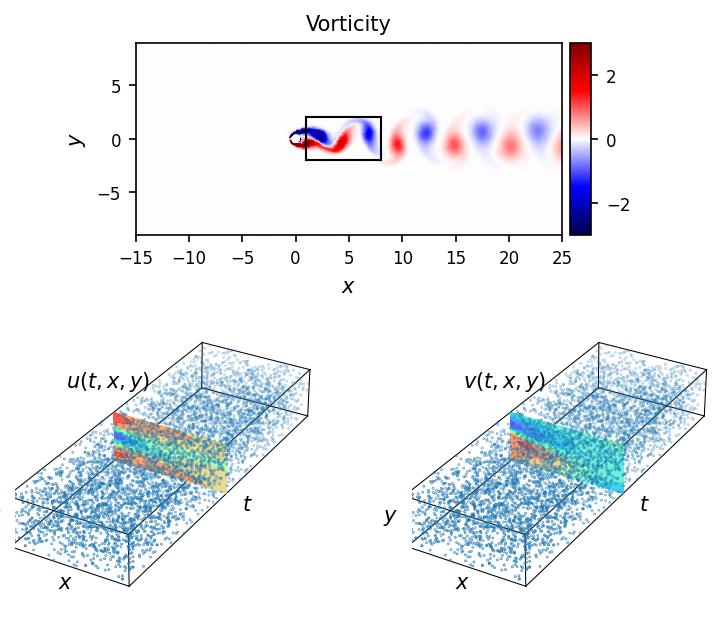

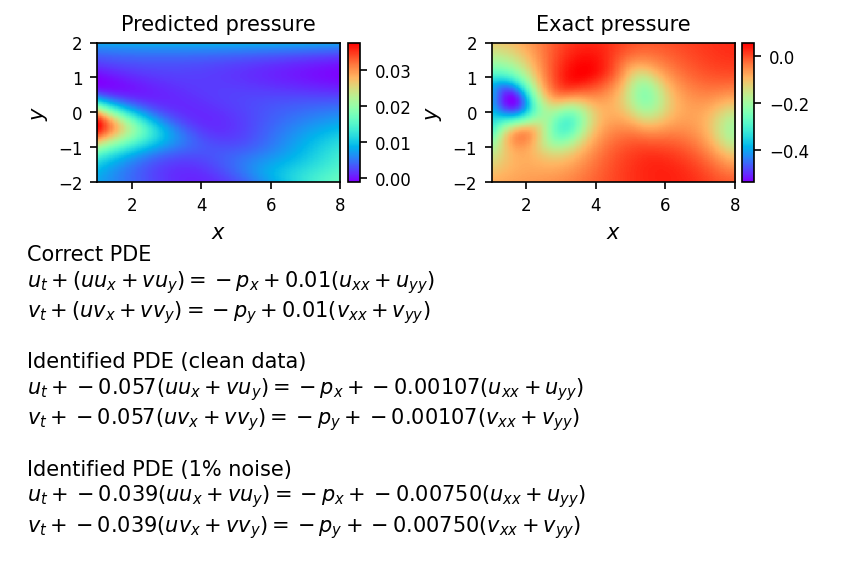

In [ ]:
%matplotlib inline

rc('text', usetex=False)
plt.rcParams['figure.dpi'] = 150

######################################################################
############################# Plotting ###############################
######################################################################    
 # Load Data
data_vort = scipy.io.loadmat('../Data/cylinder_nektar_t0_vorticity.mat')

x_vort = data_vort['x'] 
y_vort = data_vort['y'] 
w_vort = data_vort['w'] 
modes = np.asscalar(data_vort['modes'])
nel = np.asscalar(data_vort['nel'])    

xx_vort = np.reshape(x_vort, (modes+1,modes+1,nel), order = 'F')
yy_vort = np.reshape(y_vort, (modes+1,modes+1,nel), order = 'F')
ww_vort = np.reshape(w_vort, (modes+1,modes+1,nel), order = 'F')

box_lb = np.array([1.0, -2.0])
box_ub = np.array([8.0, 2.0])

fig, ax = newfig(1.0, 1.2)
ax.axis('off')

####### Row 0: Vorticity ##################    
gs0 = gridspec.GridSpec(1, 2)
gs0.update(top=1-0.06, bottom=1-2/4 + 0.12, left=0.0, right=1.0, wspace=0)
ax = plt.subplot(gs0[:, :])

for i in range(0, nel):
    h = ax.pcolormesh(xx_vort[:,:,i], yy_vort[:,:,i], ww_vort[:,:,i], cmap='seismic',shading='gouraud',  vmin=-3, vmax=3) 
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(h, cax=cax)

ax.plot([box_lb[0],box_lb[0]],[box_lb[1],box_ub[1]],'k',linewidth = 1)
ax.plot([box_ub[0],box_ub[0]],[box_lb[1],box_ub[1]],'k',linewidth = 1)
ax.plot([box_lb[0],box_ub[0]],[box_lb[1],box_lb[1]],'k',linewidth = 1)
ax.plot([box_lb[0],box_ub[0]],[box_ub[1],box_ub[1]],'k',linewidth = 1)

ax.set_aspect('equal', 'box')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_title('Vorticity', fontsize = 10)


####### Row 1: Training data ##################
########      u(t,x,y)     ###################        
gs1 = gridspec.GridSpec(1, 2)
gs1.update(top=1-2/4, bottom=0.0, left=0.01, right=0.99, wspace=0)
ax = plt.subplot(gs1[:, 0],  projection='3d')
ax.axis('off')

r1 = [x_star.min(), x_star.max()]
r2 = [data['t'].min(), data['t'].max()]       
r3 = [y_star.min(), y_star.max()]

for s, e in combinations(np.array(list(product(r1,r2,r3))), 2):
    if np.sum(np.abs(s-e)) == r1[1]-r1[0] or np.sum(np.abs(s-e)) == r2[1]-r2[0] or np.sum(np.abs(s-e)) == r3[1]-r3[0]:
        ax.plot3D(*zip(s,e), color="k", linewidth = 0.5)   

ax.scatter(x_train, t_train, y_train, s = 0.1)
ax.contourf(X,UU_star,Y, zdir = 'y', offset = t_star.mean(), cmap='rainbow', alpha = 0.8)

ax.text(x_star.mean(), data['t'].min() - 1, y_star.min() - 1, '$x$')
ax.text(x_star.max()+1, data['t'].mean(), y_star.min() - 1, '$t$')
ax.text(x_star.min()-1, data['t'].min() - 0.5, y_star.mean(), '$y$')
ax.text(x_star.min()-3, data['t'].mean(), y_star.max() + 1, '$u(t,x,y)$')    
ax.set_xlim3d(r1)
ax.set_ylim3d(r2)
ax.set_zlim3d(r3)
axisEqual3D(ax)

########      v(t,x,y)     ###################        
ax = plt.subplot(gs1[:, 1],  projection='3d')
ax.axis('off')

r1 = [x_star.min(), x_star.max()]
r2 = [data['t'].min(), data['t'].max()]       
r3 = [y_star.min(), y_star.max()]

for s, e in combinations(np.array(list(product(r1,r2,r3))), 2):
    if np.sum(np.abs(s-e)) == r1[1]-r1[0] or np.sum(np.abs(s-e)) == r2[1]-r2[0] or np.sum(np.abs(s-e)) == r3[1]-r3[0]:
        ax.plot3D(*zip(s,e), color="k", linewidth = 0.5)   

ax.scatter(x_train, t_train, y_train, s = 0.1)
ax.contourf(X,VV_star,Y, zdir = 'y', offset = t_star.mean(), cmap='rainbow', alpha = 0.8)

ax.text(x_star.mean(), data['t'].min() - 1, y_star.min() - 1, '$x$')
ax.text(x_star.max()+1, data['t'].mean(), y_star.min() - 1, '$t$')
ax.text(x_star.min()-1, data['t'].min() - 0.5, y_star.mean(), '$y$')
ax.text(x_star.min()-3, data['t'].mean(), y_star.max() + 1, '$v(t,x,y)$')    
ax.set_xlim3d(r1)
ax.set_ylim3d(r2)
ax.set_zlim3d(r3)
axisEqual3D(ax)

# savefig('./figures/NavierStokes_data') 


fig, ax = newfig(1.015, 0.8)
ax.axis('off')

######## Row 2: Pressure #######################
########      Predicted p(t,x,y)     ########### 
gs2 = gridspec.GridSpec(1, 2)
gs2.update(top=1, bottom=1-1/2, left=0.1, right=0.9, wspace=0.5)
ax = plt.subplot(gs2[:, 0])
h = ax.imshow(PP_star, interpolation='nearest', cmap='rainbow', 
              extent=[x_star.min(), x_star.max(), y_star.min(), y_star.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

fig.colorbar(h, cax=cax)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_aspect('equal', 'box')
ax.set_title('Predicted pressure', fontsize = 10)

########     Exact p(t,x,y)     ########### 
ax = plt.subplot(gs2[:, 1])
h = ax.imshow(P_exact, interpolation='nearest', cmap='rainbow', 
              extent=[x_star.min(), x_star.max(), y_star.min(), y_star.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

fig.colorbar(h, cax=cax)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.set_aspect('equal', 'box')
ax.set_title('Exact pressure', fontsize = 10)


######## Row 3: Table #######################
gs3 = gridspec.GridSpec(1, 2)
gs3.update(top=1-1/2, bottom=0.0, left=0.0, right=1.0, wspace=0)
ax = plt.subplot(gs3[:, :])
ax.axis('off')

s = "Correct PDE\n"
s = s + "$u_t + (u u_x + v u_y) = -p_x + 0.01 (u_{xx} + u_{yy})$\n"
s = s + "$v_t + (u v_x + v v_y) = -p_y + 0.01 (v_{xx} + v_{yy})$\n"
s = s + "\n"
s = s + "Identified PDE (clean data)\n"
s = s + "$u_t + %.3f (u u_x + v u_y) = -p_x + %.5f (u_{xx} + u_{yy})$\n" % (lambda_1_value, lambda_2_value)
s = s + "$v_t + %.3f (u v_x + v v_y) = -p_y + %.5f (v_{xx} + v_{yy})$\n" % (lambda_1_value, lambda_2_value)
s = s + "\n"
s = s + "Identified PDE (1% noise)\n"
s = s + "$u_t + %.3f (u u_x + v u_y) = -p_x + %.5f (u_{xx} + u_{yy})$\n" % (lambda_1_value_noisy, lambda_2_value_noisy)
s = s + "$v_t + %.3f (u v_x + v v_y) = -p_y + %.5f (v_{xx} + v_{yy})$\n" % (lambda_1_value_noisy, lambda_2_value_noisy)
s = ax.text(0.015, -0.7, s)

# savefig('./figures/NavierStokes_prediction') 